## BERNEAUD Noah

## TP 1


In [2]:
import skimage
#import imutils
import matplotlib.image as mpimg
import matplotlib.pylab as plt
import numpy as np
import cv2


### 1. Morphing entre deux images

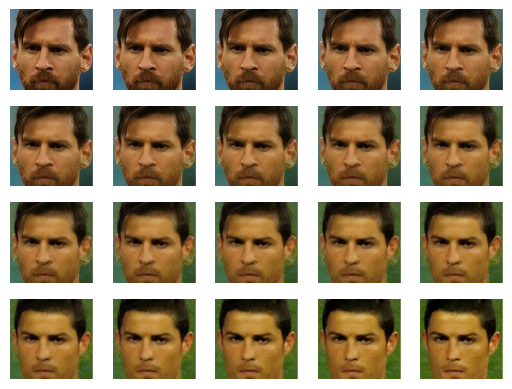

<Figure size 1800x1500 with 0 Axes>

In [3]:
im1 = cv2.imread("images/messi.jpg")
im2 = cv2.imread("images/ronaldo.jpg")
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)
im1 = im1/255
im2 = im2/255
i = 1
for(alpha) in np.linspace(0,1,20):
    im = (1-alpha)*im1 + alpha*im2
    plt.subplot(4,5,i)
    plt.imshow(im)
    plt.axis('off')
    i = i+1
plt.figure(figsize=(18,15))
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### 2. Interpolation d'images avec matplotlib


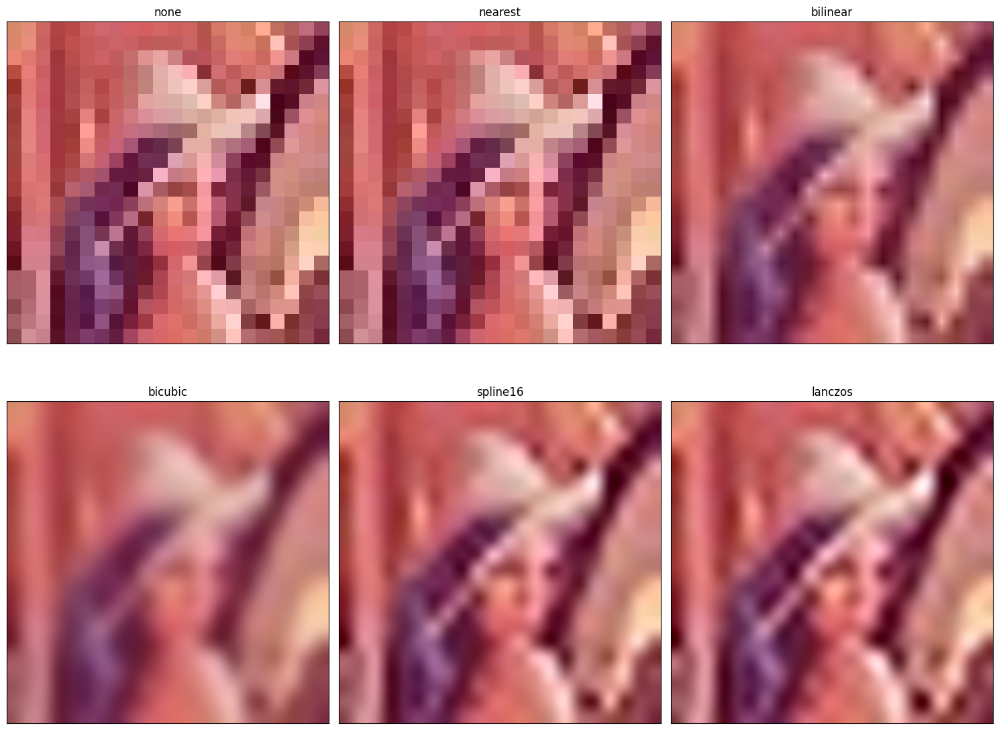

In [4]:
# Afficher l'image
im = mpimg.imread("images/lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method, cmap='viridis')
    ax.set_title(interp_method)
plt.tight_layout()
plt.show()

### 3. Template Matching avec cross-correlation entre l'image et le modèle


Il existe diverses méthodes pour effectuer la mise en correspondance de modèles, mais dans ce cas, nous utilisons le coefficient de corrélation spécifié par  cv2.TM_CCOEFF.

Alors, que fait exactement la fonction cv2.matchTemplate ?
Essentiellement, cette fonction prend une "fenêtre glissante" de notre image de requête de Waldo et la fait glisser sur notre image de puzzle de gauche à droite et de haut en bas, un pixel à la fois. Ensuite, pour chaque emplacement, nous calculons le coefficient de corrélation pour déterminer à quel point la correspondance est "bonne" ou "mauvaise".

Les régions avec une corrélation suffisamment élevée peuvent être considérées comme des "correspondances" pour notre modèle Waldo.
Ensuite, tout ce dont nous avons besoin, c'est un appel à cv2.minMaxLoc pour trouver où se trouvent nos "bonnes" correspondances.



Il y a aussi : signal.correlate2d   de scipy

from scipy import signal


#### Notes on Template Matching

http://docs.opencv.org/2.4/modules/imgproc/doc/object_detection.html      


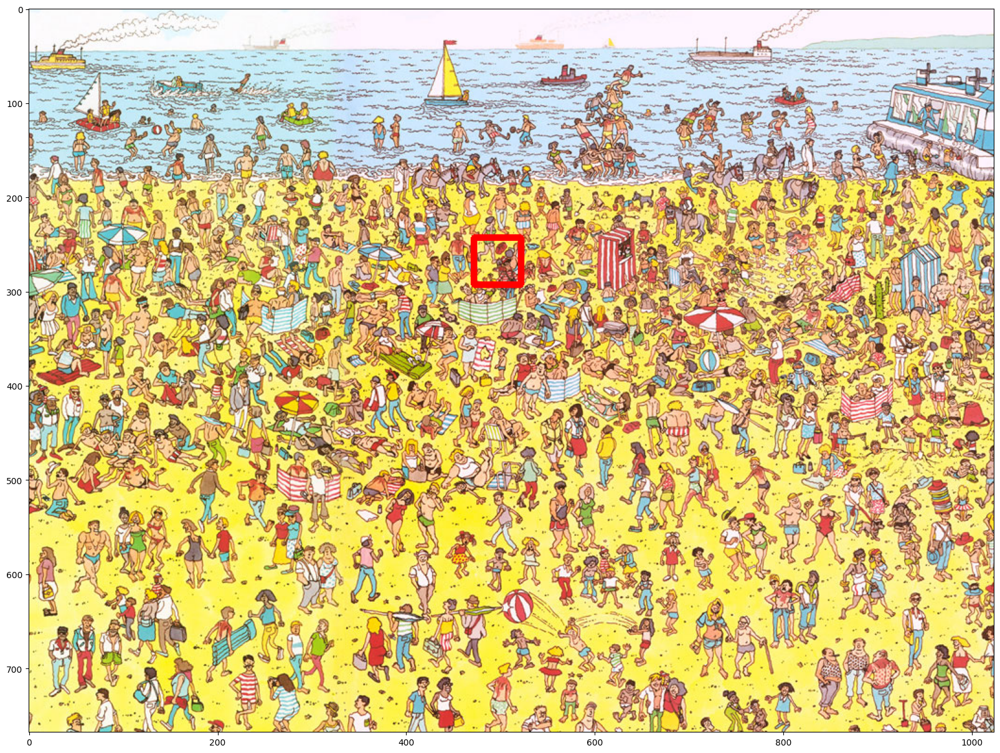

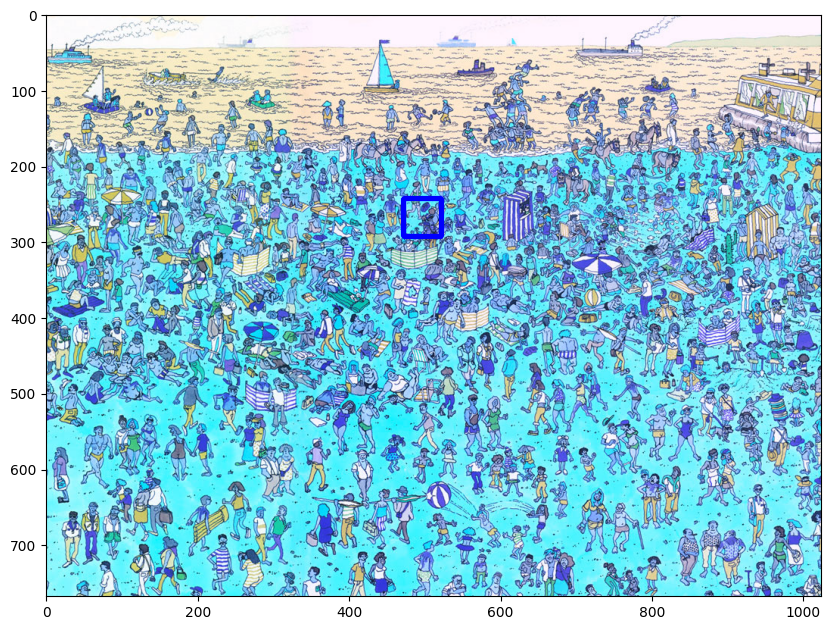

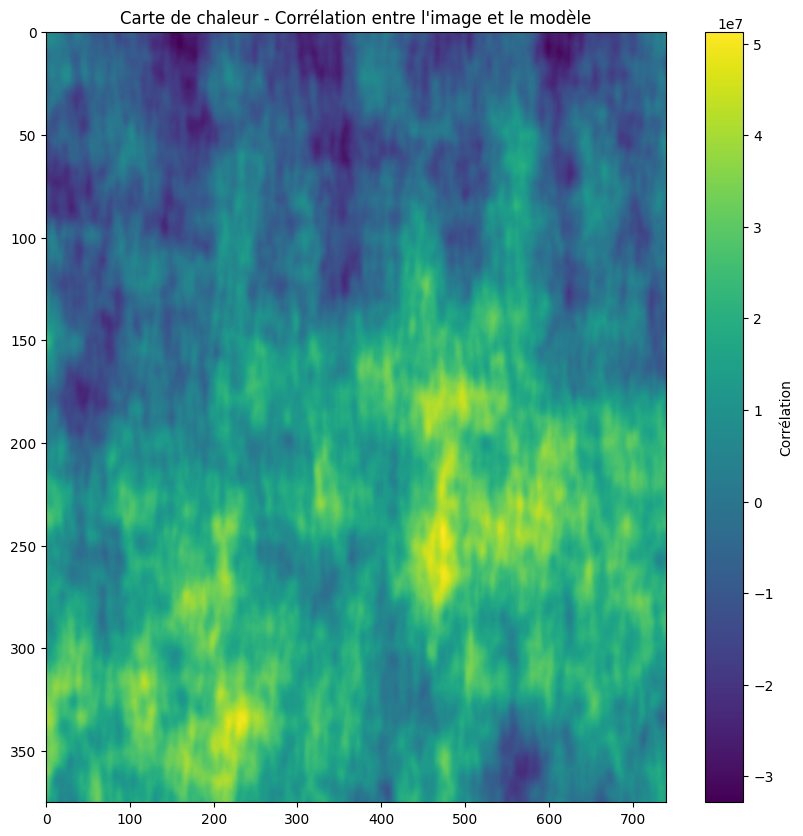

In [5]:
import cv2
import numpy as np
import matplotlib.pylab as plt

# Charger l'image du modèle (Template image) : waldo.jpg en niveau de gris
template = cv2.imread('images/waldo.jpg')
template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)



# Charger l'image : WaldoBeach.jpg en couleur
image = cv2.imread('images/WaldoBeach.jpg')


plt.figure(figsize=(20,20))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


# Apparier (Matchez) la template et l'image (en niveau de gris) en utilisant cv2.matchTemplate avec le coefficient de corrélation spécifié par  cv2.TM_CCOEFF.
result = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF)


# Récupérer la localisation avec le score le plus élevé ==> Utiliser cv2.minMaxLoc(result)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

#Creer Le Rectangle englobant avec cv2.rectangle
top_left = max_loc
bottom_right = (top_left[0] + 50, top_left[1] + 50)
cv2.rectangle(image, top_left, bottom_right, (0,0,255), 5)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Afficher l'image avec le rectangle englobant
plt.imshow(image)



# Afficher l'image avec le rectangle englobant
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Afficher la carte de chaleur
plt.figure(figsize=(10, 10))
plt.imshow(result, cmap='viridis', vmin=np.min(result), vmax=np.max(result), aspect='auto', extent=[0, result.shape[1], result.shape[0], 0])
plt.title('Carte de chaleur - Corrélation entre l\'image et le modèle')
plt.colorbar(label='Corrélation')  # Ajouter une légende pour les couleurs

plt.show()



### 4. Identifier les formes

*cv2.findContours(image, Retrieval Mode, Approximation Method)*

Returns -> contours, hierarchy

*NOTE** In OpenCV 3.X, findContours returns a 3rd argument which is ret (or a boolean indicating if the function was successfully run). 

If you're using OpenCV 3.X replace line 12 with:

_, contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

The variable 'contours' are stored as a numpy array of (x,y) points that form the contour

While, 'hierarchy' describes the child-parent relationships between contours (i.e. contours within contours)



#### Approximation Methods

Using cv2.CHAIN_APPROX_NONE stores all the boundary points. But we don't necessarily need all bounding points. If the points form a straight line, we only need the start and ending points of that line.

Using cv2.CHAIN_APPROX_SIMPLE instead only provides these start and end points of bounding contours, thus resulting in much more efficent storage of contour information..

In [6]:
def moments_central_norm(p,q,xc,yc, img):
    somme = 0
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            somme += img[x][y] * ((x - xc ) ** p) * ((y-yc) ** q)
    return somme


def moments_central(p,q, img):
    moment = cv2.moments(img)
    xc = int(moment["m10"] / moment["m00"])
    yc = int(moment["m01"] / moment["m00"])
    return moments_central_norm(p,q,xc,yc, img)

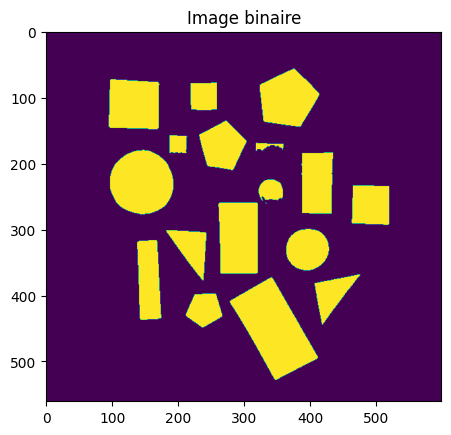

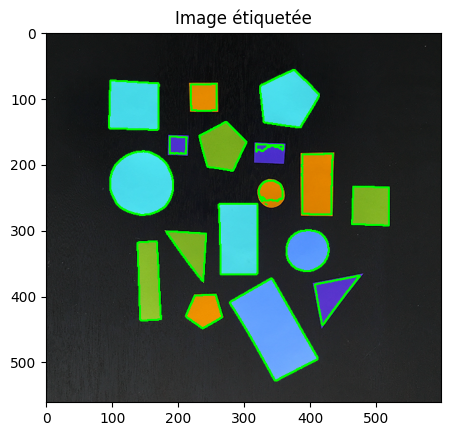

: 

In [ ]:

import cv2

class ShapeDetector:
    def __init__(self):
        pass

    def detect(self, c, i ):
        # initialiser le nom de la forme et estimer le contour
        shape = "non identifie"
        peri = cv2.arcLength(c, True)
        approx = cv2.approxPolyDP(c, 0.04 * peri, True)

        # Triangle : 3 côtés
        if len(approx) == 3:
            shape = "triangle"

        # Rectangle : 4 côtés
        elif len(approx) == 4:
            # Extraire le rectangle du cointour (forme) pour calculer  le rapport élongation :largeur(w) /hauteur (h)
            # ==> utiliser cv2.boundingRect
            (x, y, w, h) = cv2.boundingRect(approx)
            ar = w / float(h)

            # Un carré aura un rapport hauteur-largeur qui est approximativement égal à un. Sinon, la forme est un rectangle.
            if ar >= 0.95 and ar <= 1.05:
                shape = "carre"
            else:
                #Crop image pour avoir le rectangle
                epsilon = 4
                cropped_image = image[y - epsilon:y + h + epsilon, x - epsilon:x + w + epsilon]
                cv2.imshow("Cropped Rectangle", cropped_image)
                #save image
                cv2.imwrite("images/rectangle"+str(i)+".jpg", cropped_image)
                shape = "rectangle"

        # pentagone : 3 côtés
        elif len(approx) == 5:
            shape = "pentagone"

        # Autres cas : Cercle
        else:
            shape = "cercle"

        # return the name of the shape
        return shape

import imutils
import cv2

# A compléter ...


# Charger l'image shapes_and_colors.png
image = cv2.imread("images/shapes_and_colors.png")

# convertir l'image en niveau de gris
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Lisser l'image en gris par un filtre gaussien
blurred = cv2.GaussianBlur(gray, (7, 7), 0) #COMMENTAIRE : Toujours filtré une image


# Seuiller l'image pour avoir une image binaire
# # COMMENTAIRE : Trouver un seuil avec la méthode de Otsu puis appliquer le seuillage
bin = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]


plt.imshow(bin)
plt.title("Image binaire")
plt.show()


# Trouver les contours dans l'image binanire et initialiser le détecteur de formes ==> Utiliser cv2.findContours
# A compléter .....
cnts = cv2.findContours(bin.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

cnts = imutils.grab_contours(cnts)
sd = ShapeDetector()

# Parcourir tous les contours
i=0
for c in cnts:
    # COMMENTAIRE : si c n'est pas une ligne droite cela ne marche pas, il faut utiliser cv2.approxPolyDP
    shape = sd.detect(c,i)

    # Tracer les contours sur l'image avec cv2.drawContours
    cv2.drawContours(image, [c], -1, (0, 255, 0), 2)

    moment = cv2.moments(c)

    if(moment["m00"] != 0):
         cX = int(moment["m10"] / moment["m00"])
         cY = int(moment["m01"] / moment["m00"])

        # cv2.putText(image, shape, (cX, cY), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    i=i+1
    # Afficher forme par forme
    cv2.imshow("Image", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


# Affichage de l'image finale étiquetée
plt.imshow(image)
plt.title("Image étiquetée")
plt.show()

In [ ]:

img_rect = cv2.imread("images/rectangle1.jpg")
img_rect = cv2.cvtColor(img_rect, cv2.COLOR_BGR2GRAY)

# Lisser l'image en gris par un filtre gaussien
blurred = cv2.GaussianBlur(gray, (5, 5), 0) #COMMENTAIRE : Toujours filtré une image0

# Seuiller l'image pour avoir une image binaire
# # COMMENTAIRE : Trouver un seuil avec la méthode de Otsu puis appliquer le seuillage
bin = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

direction = 1/2 * np.arctan2(2 * moments_central(1,1, img_rect) , moments_central(2,0, img_rect) - moments_central(0,2, img_rect))

moment = cv2.moments(img_rect)
cx = int(moment["m10"] / moment["m00"])
cy = int(moment["m01"] / moment["m00"])

#Mettre une fleche sur l'image
plt.imshow(img_rect)
# Draw an arrow to visualize the direction
arrow_length = 100
arrow_dx = arrow_length * np.sin(direction)
arrow_dy = arrow_length * np.cos(direction)

plt.arrow(cx, cy, arrow_dx, arrow_dy, head_width=10, head_length=10, fc='k', ec='k')
plt.show()

### 5. Reconnaissance de chiffres manuscrits
#### 5.1 Préparation des données, Entraînement et Évaluation

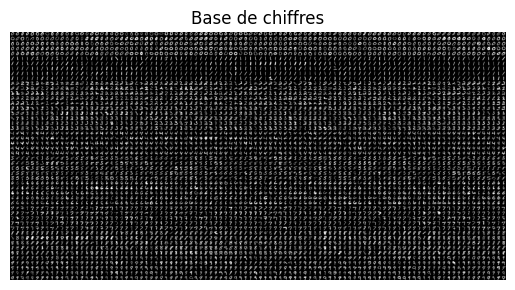

Notre tableau de données  (50, 100, 20, 20)
Accuracy is = 93.47%


In [8]:
import numpy as np
import cv2
import matplotlib.image as mpimg
import matplotlib.pylab as plt


# Let's take a look at our digits dataset
image = cv2.imread('images/digits.png')
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
#small = cv2.pyrDown(image) #  elle applique une opération de pyramide gaussienne pour réduire la résolution de l'image.
#plt.imshow(small)
plt.imshow(image)
plt.title("Base de chiffres")
plt.axis('off')
plt.show()


# Split the image to 5000 cells, each 20x20 size
# This gives us a 4-dim array: 50 x 100 x 20 x 20
cells = [np.hsplit(row,100) for row in np.vsplit(gray,50)]

# Convert the List data type to Numpy Array of shape (50,100,20,20)
x = np.array(cells)
print ("Notre tableau de données  " + str(x.shape))

# Split the full data set into two segments
# One will be used fro Training the model, the other as a test data set
train = x[:,:70].reshape(-1,400).astype(np.float32) # Size = (3500,400)
test = x[:,70:100].reshape(-1,400).astype(np.float32) # Size = (1500,400)

# Create labels for train and test data
k = [0,1,2,3,4,5,6,7,8,9]
train_labels = np.repeat(k,350)[:,np.newaxis]
test_labels = np.repeat(k,150)[:,np.newaxis]

# Initiate kNN, train the data, then test it with test data for k=3
knn = cv2.ml.KNearest_create()
knn.train(train, cv2.ml.ROW_SAMPLE, train_labels)

ret, result, neighbors, distance = knn.findNearest(test, k=3)

# Now we check the accuracy of classification
# For that, compare the result with test_labels and check which are wrong
matches = result == test_labels
correct = np.count_nonzero(matches)
accuracy = correct * (100.0 / result.size)
print("Accuracy is = %.2f" % accuracy + "%")

#### Charger une nouvelle image, à pré-traiter et à classifier les chiffres

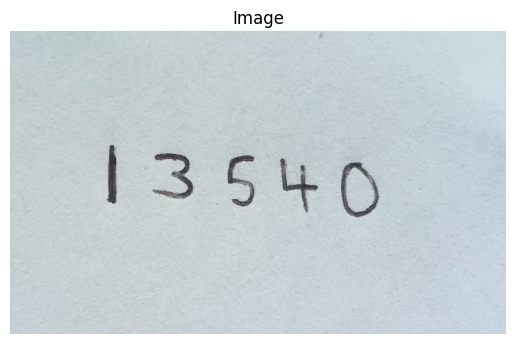

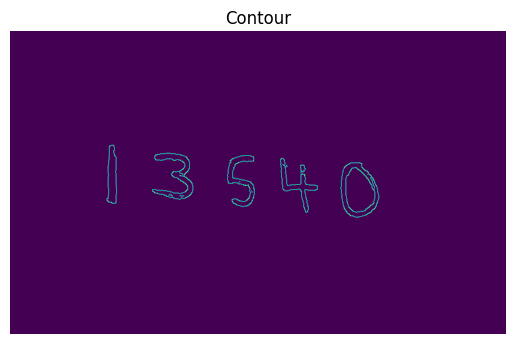

/var/folders/xw/6533cp092nl4j8x1b0rtnlpm0000gn/T/ipykernel_52489/1557446800.py:109: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  full_number.append(int(number))


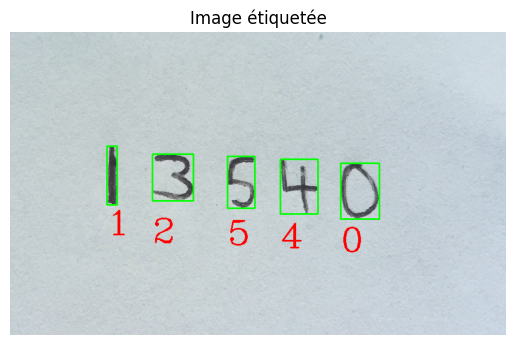

Le nombre est: 12540


In [11]:
from sklearn import svm


# Placeholder functions (replace with actual implementations)

def x_cord_contour(contour):
    if cv2.contourArea(contour) > 10:
        M = cv2.moments(contour)
        return int(M['m10'] / M['m00']) if M['m00'] != 0 else 0
    return 0


def makeSquare(not_square):
    BLACK = [0, 0, 0]
    img_dim = not_square.shape
    height = img_dim[0]
    width = img_dim[1]

    if height == width:
        square = not_square
        return square
    else:
        doublesize = cv2.resize(not_square, (2 * width, 2 * height), interpolation=cv2.INTER_CUBIC)
        height = height * 2
        width = width * 2

        if height > width:
            pad = int((height - width) / 2)
            doublesize_square = cv2.copyMakeBorder(doublesize, 0, 0, pad, pad, cv2.BORDER_CONSTANT, value=BLACK)
        else:
            pad = int((width - height) / 2)
            doublesize_square = cv2.copyMakeBorder(doublesize, pad, pad, 0, 0, cv2.BORDER_CONSTANT, value=BLACK)

    return doublesize_square

def resize_to_pixel(dimensions, image):
    buffer_pix = 4
    dimensions = dimensions - buffer_pix
    squared = image
    r = float(dimensions) / squared.shape[1]
    dim = (dimensions, int(squared.shape[0] * r))
    resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    img_dim2 = resized.shape
    height_r = img_dim2[0]
    width_r = img_dim2[1]
    BLACK = [0, 0, 0]
    if height_r > width_r:
        resized = cv2.copyMakeBorder(resized, 0, 0, 0, 1, cv2.BORDER_CONSTANT, value=BLACK)
    if height_r < width_r:
        resized = cv2.copyMakeBorder(resized, 1, 0, 0, 0, cv2.BORDER_CONSTANT, value=BLACK)
    p = 2
    ReSizedImg = cv2.copyMakeBorder(resized, p, p, p, p, cv2.BORDER_CONSTANT, value=BLACK)
    return ReSizedImg

# Load the image
image = cv2.imread('images/numbers.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.imshow(image)
plt.title("Image")
plt.axis('off')

plt.show()

# Blur image then find edges using Canny
blurred = cv2.GaussianBlur(gray, (5, 5), 0)



edged = cv2.Canny(blurred, 30, 150)
#cv2.imshow("edged", edged)
#cv2.waitKey(0)
plt.imshow(edged)
plt.title("Contour")
plt.axis('off')
plt.show()

# Find Contours
contours, _ = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)



# Trier les contours de gauche à droite selon x_cord_contour
contours = sorted(contours, key=x_cord_contour, reverse=False)

# full_number est le nombre final
full_number = []

# Loop over the contours
for c in contours:
    # Rectangle englobant de chaque contour c
    x, y, w, h = cv2.boundingRect(c)

    if w >= 5 and h >= 25:
        roi = blurred[y:y + h, x:x + w]
        _, roi = cv2.threshold(roi, 127, 255, cv2.THRESH_BINARY_INV)
        squared = makeSquare(roi)
        final = resize_to_pixel(20, squared)

        # Notre knn est dèjà pré-entrainé
        
        final_array = final.reshape((1, 400))
        final_array = final_array.astype(np.float32)

        # Utiliser les fonctions suivantes : knn, puis insérer le nombre détecter dans une liste de chiffres (nombre final)
        number = knn.predict(final_array)[1]


        full_number.append(int(number))

        # Dessinez un rectangle autour du chiffre et afficher le chiffre qui a été classifié.
        #  ==> utiliser cv2.rectangle et cv2.putText
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(image, str(int(number[0][0])), (x, y + 155),
                    cv2.FONT_HERSHEY_COMPLEX, 2, (255, 0, 0), 2)

        
plt.imshow(image)
plt.title("Image étiquetée")
plt.axis('off')
plt.show()
#cv2.destroyAllWindows()
print("Le nombre est: " + ''.join(map(str, full_number)))


In [12]:
im1 = cv2.imread("images/messi.jpg")
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im1_rotated = cv2.rotate(im1, cv2.ROTATE_90_CLOCKWISE)
im2 = cv2.resize(im1_rotated, (im1.shape[0]//2, im1.shape[1]//2))

moment = cv2.moments(im1)

momentHu = cv2.HuMoments(moment)

momentim2 = cv2.moments(im2)

momentHu2 = cv2.HuMoments(momentim2)

compareHu = momentHu2 - momentHu
print(compareHu)

[[-2.38573445e-06]
 [-4.06062263e-10]
 [-1.62222050e-14]
 [-4.40952414e-14]
 [-3.72508905e-25]
 [ 1.28890416e-17]
 [-2.49305873e-25]]


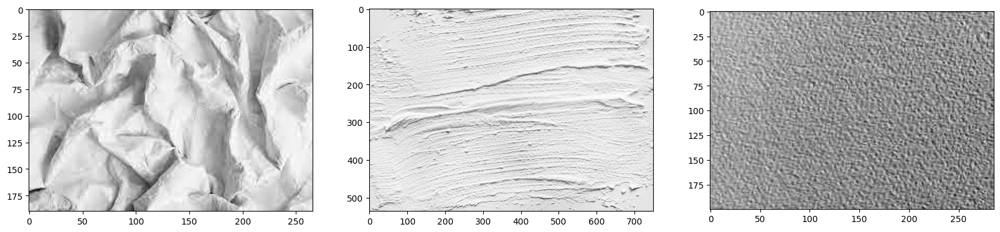

In [13]:
im1 = cv2.imread("images/texture1.png")
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2 = cv2.imread("images/texture2.png")
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
im3 = cv2.imread("images/texture3.png")
im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2GRAY)

#afiche les images
plt.figure(figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(im1, cmap='gray')
plt.subplot(1,3,2)
plt.imshow(im2, cmap='gray')
plt.subplot(1,3,3)
plt.imshow(im3, cmap='gray')
plt.show()


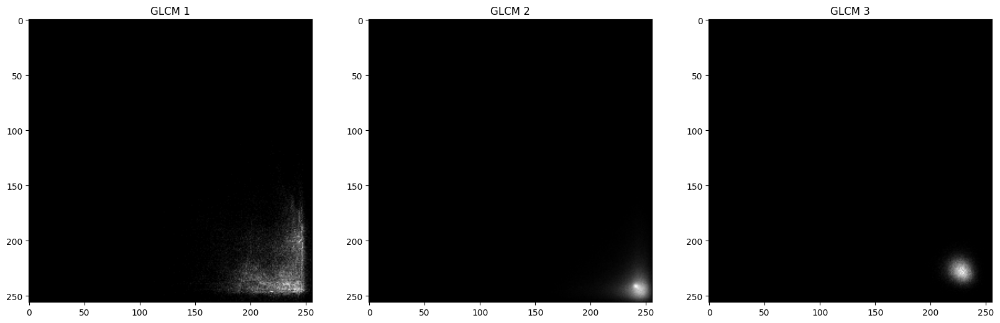

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.feature

# Assuming you have im1, im2, and im3 defined
# Compute the gray-level co-occurrence matrices
g_im1 = skimage.feature.graycomatrix(im1, distances=[25], angles=[0])
g_im2 = skimage.feature.graycomatrix(im2, distances=[20], angles=[90])
g_im3 = skimage.feature.graycomatrix(im3, distances=[10], angles=[180])

# Plotting the results
plt.figure(figsize=(20, 20))

# Plot for g_im1
plt.subplot(1, 3, 1)
plt.imshow(g_im1[:,:,0,0], cmap='gray')
plt.title('GLCM 1')

# Plot for g_im2
plt.subplot(1, 3, 2)
plt.imshow(g_im2[:,:,0,0], cmap='gray')
plt.title('GLCM 2')

# Plot for g_im3
plt.subplot(1, 3, 3)
plt.imshow(g_im3[:,:,0,0], cmap='gray')
plt.title('GLCM 3')

plt.show()